In [7]:
import numpy as np
import pandas as pd
from PyEMD import EMD 
from scipy.signal import convolve
from scipy.signal import butter, lfilter, freqz
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib
from utils import process_raw_data, process_phantom
from glob import glob
from tqdm import tqdm
import matplotlib.ticker as mtick
import json
from scipy.interpolate import interp1d
from natsort import natsorted 
# Default settings
mpl.rcParams.update(mpl.rcParamsDefault)
plt.style.use("seaborn-darkgrid")

C:\Users\dicky1031\AppData\Local\Temp\ipykernel_19884\2970263897.py:19: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-darkgrid")


## Format Setting

In [29]:
subject_name = 'KB'
exp = 'VM'
date = '20230912'
pname = ['VM']

time_resolution = 0.10404 # [sec] # 0.10404, 0.10129
using_SDS = 10 # [mm]
phantom_measured_ID = ['22', '33', '44', '55']
phantom_simulated_ID = ['2', '3', '4', '5']
SDS_idx = 3  # SDS=10 mm, phantom simulated idx

previous_phantom_measured_ID = ['2', '3', '4', '5']
previous_date = '20230819'
previous_ofolder = os.path.join('dataset', subject_name, 'SDS1', f'm_out_{previous_date}')
previous_mother_folder_name = os.path.join(subject_name, "SDS1", previous_date)

## exp setting
baseline_start = 0 # [sec]
baseline_end = 60 # [sec]
HP_start = 60 # [sec]
HP_end = 75 # [sec]
recovery_start = 75 # [sec]
recovery_end = 675 # [sec] 

# setting
moving_window = 3 # [nm]
time_interval = 30 # [sec]

## EMCCD setting 
ifolder = os.path.join('dataset', subject_name, 'SDS1', f'{date}')
# used short channel
used_ch = 'ch3'
SDS_LIST = [4.5, 7.5, 10.5]
ofolder = os.path.join('dataset', subject_name, 'SDS1', f'm_out_{date}_{exp}')
os.makedirs(ofolder, exist_ok=True)


# Wavelength calibration factor defined : y = ax + b
a = 3.0375
b = 331.88

# Choose wavelength
start_wl = 119
stop_wl = 183

# Choose fiber output range
row_choose = ((2, 5), (6, 9), (11, 14))


mother_folder_name = os.path.join(subject_name, "SDS1", date, exp)
background_filenpath = os.path.join("dataset", subject_name, "SDS1", date,'background.csv')
data_filepath = os.path.join(ofolder, f'{subject_name}_SDS1_sync.csv')




## Process Spectrapro+EMCCD raw data (image to csv file)

100%|██████████| 1/1 [00:51<00:00, 51.89s/it]


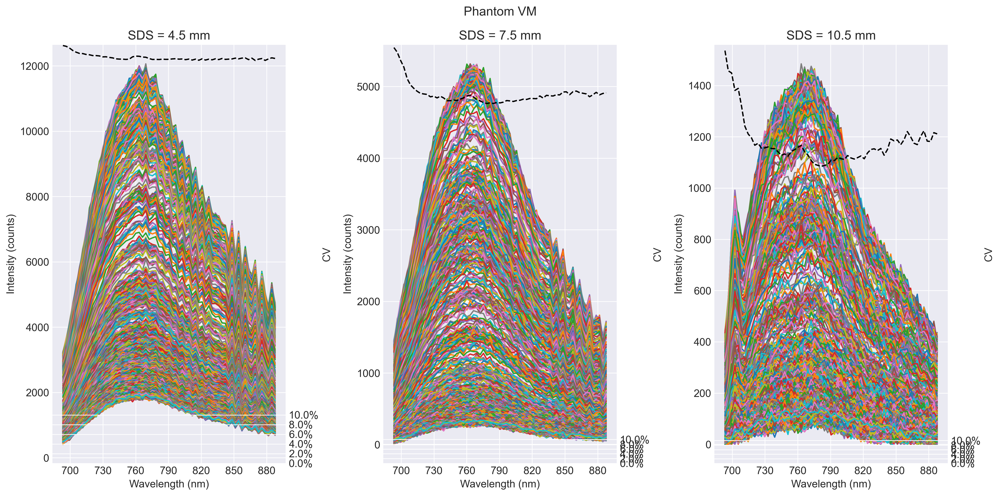

In [24]:
# %% Load target spectrum
folder_list = glob(os.path.join(ifolder, '*'))
stdname = 'standard0.1'
if any(stdname in folder_list[i] for i in range(len(folder_list))):
    path_det_bg = glob(os.path.join(ifolder, stdname, 'background*'))
    path_det_bg = natsorted(path_det_bg)
    
    path_det = glob(os.path.join(ifolder, stdname, 'std*')) 
    path_det = natsorted(path_det)
    
    bg_arr, df_det_mean, df_det_ch1, df_det_ch2, df_det_ch3 = process_raw_data.get_spec(path_det_bg, path_det, row_choose, a, b, img_size=(20, 320))
    df_det_mean.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_mean.csv'), index = False)
    df_det_ch1.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_ch1.csv'), index = False)
    df_det_ch2.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_ch2.csv'), index = False)
    df_det_ch3.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_ch3.csv'), index = False)
    
for tar_name in tqdm(pname):
    path_det_bg = glob(os.path.join(ifolder, tar_name, 'background*'))
    path_det_bg = natsorted(path_det_bg)
    
    path_det = glob(os.path.join(ifolder, tar_name, subject_name + '*')) 
    path_det = natsorted(path_det)
    
    bg_arr, df_det_mean, df_det_ch1, df_det_ch2, df_det_ch3 = process_raw_data.get_spec(path_det_bg, path_det, row_choose, a, b, img_size=(20, 320))
    df_det_mean.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_mean.csv'), index = False)
    df_det_ch1.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_ch1.csv'), index = False)
    df_det_ch2.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_ch2.csv'), index = False)
    df_det_ch3.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_ch3.csv'), index = False)
    det_list = [df_det_ch1, df_det_ch2, df_det_ch3]
    stat_list = process_raw_data.get_stat(det_list, start_wl, stop_wl)
    fig, ax = plt.subplots(1, 3, figsize=(16, 8), dpi=300)
    for i in range(3):
        for j in range(df_det_ch1.shape[1]-1):
            ax[i].plot(det_list[i].loc[start_wl:stop_wl, 'wl'], det_list[i].loc[start_wl:stop_wl, f'shot_{j}'])
        ax[i].set_title(f'SDS = {SDS_LIST[i]} mm')
        ax[i].set_xticks(np.arange(700, 881, 30))
        ax[i].set_xlabel('Wavelength (nm)')
        ax[i].set_ylabel('Intensity (counts)')
        ax2 = ax[i].twinx()
        ax2.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1f%%'))
        ax2.plot(stat_list[i]['wl'], 100 * stat_list[i]['cv'], color='black', linestyle='--')
        ax2.set_ylabel('CV')
        ax2.set_yticks(np.linspace(0, 10, 6))
        ax2.tick_params(axis='y')
        
    fig.suptitle(f'Phantom {tar_name}')
    fig.tight_layout()
    fig.savefig(os.path.join(ofolder, f'{tar_name}.png'))

## Sync spectraprofile to QEpro file

In [30]:
data = pd.read_csv(os.path.join(ofolder, f'{pname[0]}_det_{used_ch}.csv'))
total_wl = data['wl'].to_numpy(dtype=np.float64)
data = data.to_numpy().T
time = [i*time_resolution for i in range(1,data.shape[0])]
df = {'Wavelength (nm)': time}
for idx, wl in enumerate(total_wl):
    df[wl] = data[1:,idx]
df = pd.DataFrame(df)
df.to_csv(os.path.join(ofolder, f'{subject_name}_SDS1_sync.csv'), index=False)
df

,Wavelength (nm),693.3425,696.38,699.4175,702.4549999999999,705.4925000000001,708.53,711.5675,714.605,717.6424999999999,...,860.405,863.4425,866.48,869.5175,872.5550000000001,875.5925,878.63,881.6675,884.705,887.7425000000001
0,0.10404,350.70,487.96,720.86,873.42,842.06,717.82,732.28,809.84,850.34,...,587.64,535.98,564.36,511.66,440.60,473.2,452.56,407.66,421.30,388.26
1,0.20808,346.70,495.96,710.86,854.42,803.06,697.82,736.28,803.84,864.34,...,594.64,555.98,541.36,484.66,464.60,461.2,475.56,422.66,406.30,386.26
2,0.31212,344.70,449.96,703.86,862.42,774.06,714.82,731.28,797.84,814.34,...,530.64,554.98,513.36,481.66,456.60,443.2,467.56,405.66,413.30,368.26
3,0.41616,355.70,480.96,765.86,856.42,776.06,705.82,745.28,809.84,908.34,...,545.64,531.98,527.36,493.66,449.60,468.2,469.56,386.66,373.30,392.26
4,0.52020,354.42,477.96,736.86,930.42,824.06,737.82,785.28,780.84,911.34,...,568.64,531.98,544.36,478.66,469.84,464.2,432.56,421.66,402.30,383.26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6745,701.85384,23.24,33.96,31.58,54.94,35.66,58.32,80.50,62.32,70.28,...,48.64,27.50,49.24,38.88,39.84,47.9,29.14,40.22,39.02,24.04
6746,701.95788,4.24,30.28,21.58,51.28,41.62,25.32,65.28,57.28,77.28,...,60.48,44.50,50.24,42.88,38.60,45.9,28.56,26.22,48.30,43.04
6747,702.06192,7.24,28.28,30.58,43.28,48.62,43.32,57.54,68.84,65.28,...,51.48,51.98,58.36,59.66,33.84,39.9,18.14,63.22,27.84,26.26
6748,702.16596,27.24,23.28,28.58,34.28,47.66,36.50,59.50,51.32,68.34,...,50.64,48.98,47.36,42.88,45.84,38.9,41.14,34.22,33.30,46.26


## Initialize Processer Instance

In [31]:
process_raw_data.create_folder(mother_folder_name)

Processer = process_raw_data(baseline_start=baseline_start,
                             baseline_end=baseline_end,
                             HP_start=HP_start,
                             HP_end=HP_end,
                             recovery_start=recovery_start,
                             recovery_end=recovery_end,
                             time_resolution=time_resolution,
                             time_interval=time_interval,
                             mother_folder_name=mother_folder_name,
                             using_SDS=using_SDS)


## Process Raw in-vivo Data

In [32]:
def remove_spike(wl, data, normalStdTimes, ts):
    # data : Nx --> time, Ny --> wavelength 
    data_no_spike = data.copy()
    mean = data_no_spike.mean(axis=0)
    std = data_no_spike.std(ddof=1, axis=0)
    targetSet = []  # save spike idx
    for idx, s in enumerate(data_no_spike):  # iterate spectrum in every time frame
        isSpike = np.any(abs(s-mean) > normalStdTimes*std)
        if isSpike:
            targetSet.append(idx) 
    print(f"target = {targetSet}")
    if len(targetSet) != 0:
        for target in targetSet:
            # show target spec and replace that spec by using average of the two adjacents
            if ((target+1) < data_no_spike.shape[0]) & ((target-1) >= 0 ): 
                data_no_spike[target] = (data_no_spike[target-1] + data_no_spike[target+1]) / 2
            elif (target+1) == data_no_spike.shape[0]:
                data_no_spike[target] = data_no_spike[target-1]
            elif (target-1) <= 0:
                data_no_spike[target] = data_no_spike[target+1]
            
    return data_no_spike

In [33]:
# load raw data
raw_data, total_wl = Processer.read_file(data_filepath)

# select range 700nm~850nm
idx_700nm = np.argmin(np.abs(total_wl-700))
idx_850nm = np.argmin(np.abs(total_wl-850))
raw_data, total_wl = raw_data[:, idx_700nm:idx_850nm], total_wl[idx_700nm:idx_850nm]


def remove_peak(data):
    mean_data = data.mean()
    max_data = data.max()
    min_data = data.min()
    up_range = abs(max_data - mean_data)
    down_range = abs(mean_data - min_data)
    get_peak = up_range if (up_range > down_range) else down_range
    used_bound = max_data if (up_range > down_range) else min_data
    remove_idx = []
    for idx, d in enumerate(data):
        if abs(d - used_bound) < 0.7*get_peak:
            # data[idx] = mean_data
            remove_idx += [idx]
    
    return remove_idx

# data_no_peak = raw_data.copy()
# for ts in range(0, recovery_end, 10):
#     td = ts + 10
#     for wl in range(raw_data.shape[1]):
#         data_no_peak[round(ts/time_resolution):round(td/time_resolution), wl] = remove_peak(data=raw_data[round(ts/time_resolution):round(td/time_resolution), wl])
    

# # remove spike
# data_no_spike = data_no_peak.copy()
# for ts in range(0, recovery_end, 10):
#     td = ts + 10
#     data_no_spike[round(ts/time_resolution):round(td/time_resolution)] = remove_spike(total_wl, data_no_peak[round(ts/time_resolution):round(td/time_resolution)], 
#                                                                                       normalStdTimes=2, 
#                                                                                       ts = ts)


## Low Pass Filter
# # Filter requirements.
# order = 6
# fs = 1/time_resolution # sample rate, Hz
# cutoff = 3  # desired cutoff frequency of the filter, Hz
# # Filter the data, and plot both the original and filtered signals.
# LPF_data = data_moving_avg.copy()
# for i in range(data_moving_avg.shape[1]):
#     LPF_data[:,i] = process_raw_data.butter_lowpass_filter(data_moving_avg[:,i], cutoff, fs, order)

## EMD
data_EMD = raw_data.copy()
# remove all-time signal based at first
imfs = EMD().emd(raw_data.mean(axis=1))
imfs[-1] -= imfs[-1].mean()
artifact = imfs[2:] 
# remove artifact
for art in artifact:
    data_EMD -= art.reshape(-1, 1)


# remove peaks
data_no_peak = raw_data.copy()
for ts in range(0, recovery_end, 10):
    td = ts + 10
    for wl in range(raw_data.shape[1]):
        remove_idx = remove_peak(data=data_EMD[round(ts/time_resolution):round(td/time_resolution), wl])
        data_no_peak[round(ts/time_resolution)+np.array(remove_idx),wl] = data_no_peak[round(ts/time_resolution):round(td/time_resolution),wl].mean()

# remove spike
data_no_spike = data_no_peak.copy()
for ts in range(0, recovery_end, 10):
    td = ts + 10
    data_no_spike[round(ts/time_resolution):round(td/time_resolution)] = remove_spike(total_wl, data_no_peak[round(ts/time_resolution):round(td/time_resolution)], 
                                                                                      normalStdTimes=3, 
                                                                                      ts = ts)

## EMD
data_EMD = data_no_spike.copy()
# remove all-time signal based at first
imfs = EMD().emd(data_no_spike.mean(axis=1))
imfs[-1] -= imfs[-1].mean()
artifact = imfs[2:] 
# remove artifact
for art in artifact:
    data_EMD -= art.reshape(-1, 1)

# detect peak 
is_peak = np.zeros(data_EMD.shape[0])
for ts in range(0, recovery_end, time_interval):
    td = ts+time_interval
    data_signal = data_EMD[round(ts/time_resolution):round(td/time_resolution), :].mean(axis=1)
    max_idx, min_idx = process_raw_data.get_peak_final(data_signal)
    is_peak[min_idx + round(ts/time_resolution)] = -1
    is_peak[max_idx + round(ts/time_resolution)] = 1


# ## EMD used as processed data
# data_EMD = data_no_spike.copy()
# # remove all-time signal based at first
# imfs = EMD().emd(data_no_spike.mean(axis=1))
# imfs[-1] -= imfs[-1].mean()
# artifact = imfs[4:] 
# # remove artifact
# for art in artifact:
#     data_EMD -= art.reshape(-1, 1)

# save result 
save_result = {}
time = [i*time_resolution for i in range(data_EMD.shape[0])]
save_result['time(s)'] = time
save_result['peak'] = is_peak # max:+1, min:-1
for idx, using_wl in enumerate(total_wl):
    save_result[f'{using_wl}nm'] = data_EMD[:,idx]
save_result = pd.DataFrame(save_result)
save_result.to_csv(os.path.join("dataset", mother_folder_name, f"in_vivo_result_{exp}.csv"), index=False)


target = [25, 34, 39, 45, 51, 58, 59, 60, 74, 83, 92]
target = [18, 40, 49, 56, 58, 85, 86]
target = [0, 2, 22, 29, 31, 47, 50, 52, 53, 60, 80]
target = [10, 15, 44, 63, 65]
target = [17, 24, 25, 26, 28, 47, 94]
target = [0, 4, 7, 25, 35, 53, 55, 56, 57, 81, 82, 83]
target = [73, 76, 80, 87, 88, 92, 94]
target = [5, 7, 14, 92]
target = [80, 83, 85, 87, 88, 89, 90, 91, 92, 93, 94, 95]
target = []
target = [0, 1, 2, 4, 10, 24, 42, 66, 67, 68, 69, 77]
target = [2, 5, 6, 11, 14, 76, 80, 82, 83, 84, 90, 92, 93, 94]
target = [0, 11, 12, 31, 33, 34, 36, 42, 54, 55, 57, 62, 63, 67, 69, 73, 75, 77, 78, 80, 85, 87, 88, 92]
target = [0, 1, 6, 8, 11, 14, 90]
target = [2, 31, 44, 54, 62, 67, 69, 72, 73, 75, 76, 89, 90, 95]
target = [0, 1, 4, 5, 6, 7, 8, 9, 14, 19, 45, 50, 83, 84, 85, 88, 94]
target = [0, 4, 10, 11, 12, 21, 22, 24, 25, 29, 36, 45, 49, 53, 65, 67, 71, 73, 78, 89, 91, 95]
target = [0, 3, 5, 6, 19, 21, 25, 27, 30, 36, 37, 39, 40, 43, 46, 47, 48, 52, 53, 55, 58, 61, 68, 69, 70, 71, 74, 

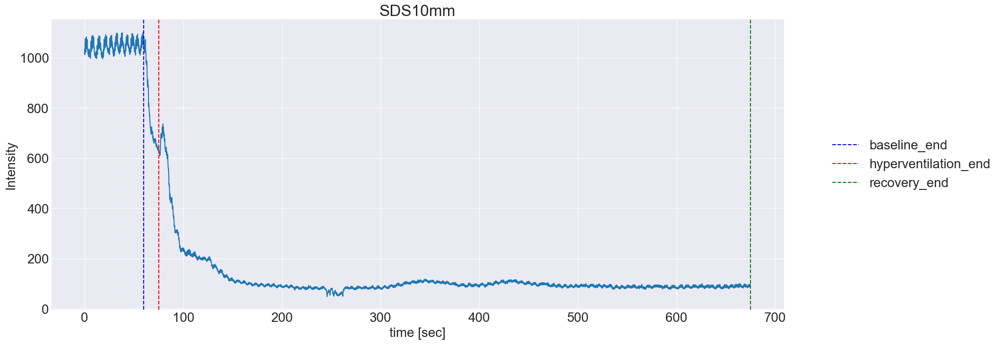

In [34]:
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(20,8))
time = np.linspace(0,recovery_end, raw_data.shape[0])
plt.plot(time, raw_data.mean(1))
plt.axvline(x=baseline_end, linestyle='--', color='b', label='baseline_end')
plt.axvline(x=HP_end, linestyle='--', color='r', label='hyperventilation_end')
plt.axvline(recovery_end, linestyle='--', color='g', label='recovery_end')
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
          fancybox=True, shadow=True)
# plt.plot(time[max_id1], used_wl_data.mean(1)[max_id1], 'r.')
# plt.plot(time[min_id1], used_wl_data.mean(1)[min_id1], 'b.')
plt.xlabel("time [sec]")
plt.ylabel("Intensity")
plt.title('SDS10mm')
plt.savefig(os.path.join('pic', mother_folder_name, 'time', 'raw', 'raw_all_time_SDS10mm.png'), dpi=300, format='png', bbox_inches='tight')
plt.show()

In [35]:
plt.rcParams.update({'font.size': 12})
Processer.long_plot_all_fig(data=raw_data, 
            wavelength=total_wl,
            name='raw')

# for ts in range(0,recovery_end,time_interval):
#     td = ts + time_interval
#     plot_LPF_compare(BF_data=data_moving_avg, 
#                      AF_data=LPF_data,
#                      start_time=ts,
#                     end_time=td,
#                     time_resolution=time_resolution,
#                     name='compare_LPF')
# plot_all_fig(data=LPF_data, 
#         wavelength=moving_avg_wl_data,
#         name='LPF')  

Processer.long_plot_all_fig(data=data_no_spike, 
            wavelength=total_wl,
            name='remove_spike_and_bg')
    
Processer.long_plot_all_fig(data=data_EMD, 
            wavelength=total_wl,
            name='EMD')

Processer.plot_Rmax_Rmin(data=data_EMD,
                         wavelength=total_wl,
                         max_idx_Set=max_idx,
                         min_idx_Set=min_idx,
                         name="get_peak",
                         start_time=0,
                         end_time=recovery_end)

for using_num_IMF in [1,2,3]:
    Processer.plot_time_EMD(data=data_no_spike,
                    name='EMD',
                    start_time=0,
                    end_time=recovery_end,
                    using_num_IMF=using_num_IMF)

    Processer.plot_compare_time_EMD(data=data_no_spike,
                        name='compare',
                        start_time=0,
                        end_time=recovery_end,
                        using_num_IMF=using_num_IMF)

    
    for ts in range(0,recovery_end,time_interval):
        td = ts + time_interval
        Processer.plot_time_EMD(data=data_no_spike,
                    name='EMD',
                    start_time=ts,
                    end_time=td,
                    using_num_IMF=using_num_IMF)

        Processer.plot_compare_time_EMD(data=data_no_spike,
                            name='compare',
                            start_time=ts,
                            end_time=td,
                            using_num_IMF=using_num_IMF)

d:\ijv_code_organized\Internal-Jugular-Vein-Project\test_prediction_model_in_vivo\utils.py:460: RuntimeWarning: Mean of empty slice.
  R_max_spec = data[max_idx_subset, :].mean(0)
d:\ijv_code_organized\venv\lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
d:\ijv_code_organized\Internal-Jugular-Vein-Project\test_prediction_model_in_vivo\utils.py:461: RuntimeWarning: Mean of empty slice.
  R_min_spec = data[min_idx_subset, :].mean(0)


## Phantom Calibration

### Process spectrapro+EMCCD raw phantom data

In [17]:
# %% Load target spectrum
folder_list = glob(os.path.join(ifolder, '*'))
stdname = 'standard0.1'
if any(stdname in folder_list[i] for i in range(len(folder_list))):
    path_det_bg = glob(os.path.join(ifolder, stdname, 'background*'))
    path_det_bg = natsorted(path_det_bg)
    
    path_det = glob(os.path.join(ifolder, stdname, 'std*')) 
    path_det = natsorted(path_det)
    
    bg_arr, df_det_mean, df_det_ch1, df_det_ch2, df_det_ch3 = process_raw_data.get_spec(path_det_bg, path_det, row_choose, a, b, img_size=(20, 320))
    df_det_mean.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_mean.csv'), index = False)
    df_det_ch1.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_ch1.csv'), index = False)
    df_det_ch2.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_ch2.csv'), index = False)
    df_det_ch3.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_ch3.csv'), index = False)
    
for tar_name in tqdm(phantom_measured_ID):
    path_det_bg = glob(os.path.join(ifolder, tar_name, 'background*'))
    path_det_bg = natsorted(path_det_bg)
    
    path_det = glob(os.path.join(ifolder, tar_name, tar_name + '*')) 
    path_det = natsorted(path_det)
    
    bg_arr, df_det_mean, df_det_ch1, df_det_ch2, df_det_ch3 = process_raw_data.get_spec(path_det_bg, path_det, row_choose, a, b, img_size=(20, 320))
    df_det_mean.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_mean.csv'), index = False)
    df_det_ch1.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_ch1.csv'), index = False)
    df_det_ch2.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_ch2.csv'), index = False)
    df_det_ch3.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_ch3.csv'), index = False)
    det_list = [df_det_ch1, df_det_ch2, df_det_ch3]
    stat_list = process_raw_data.get_stat(det_list, start_wl, stop_wl)
    fig, ax = plt.subplots(1, 3, figsize=(16, 8), dpi=300)
    for i in range(3):
        for j in range(df_det_ch1.shape[1]-1):
            ax[i].plot(det_list[i].loc[start_wl:stop_wl, 'wl'], det_list[i].loc[start_wl:stop_wl, f'shot_{j}'])
        ax[i].set_title(f'SDS = {SDS_LIST[i]} mm')
        ax[i].set_xticks(np.arange(700, 881, 30))
        ax[i].set_xlabel('Wavelength (nm)')
        ax[i].set_ylabel('Intensity (counts)')
        ax2 = ax[i].twinx()
        ax2.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1f%%'))
        ax2.plot(stat_list[i]['wl'], 100 * stat_list[i]['cv'], color='black', linestyle='--')
        ax2.set_ylabel('CV')
        ax2.set_yticks(np.linspace(0, 10, 6))
        ax2.tick_params(axis='y')
        
    fig.suptitle(f'Phantom {tar_name}')
    fig.tight_layout()
    fig.savefig(os.path.join(ofolder, f'{tar_name}.png'))

  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 4/4 [00:07<00:00,  1.85s/it]


## Sync spectraprofile to QEpro file

In [18]:
for phantom_ID in phantom_measured_ID:
    data = pd.read_csv(os.path.join(ofolder, f'{phantom_ID}_det_ch3.csv'))
    total_wl =  data['wl'].to_numpy(dtype=np.float64)
    data = data.to_numpy().T
    time = [i*time_resolution for i in range(1,data.shape[0])]
    df = {'Wavelength (nm)': time}
    for idx, wl in enumerate(total_wl):
        df[wl] = data[1:,idx]
    df = pd.DataFrame(df)
    df.to_csv(os.path.join(ofolder, f'{phantom_ID}_SDS1_sync.csv'), index=False)
df

,Wavelength (nm),693.3425,696.38,699.4175,702.4549999999999,705.4925000000001,708.53,711.5675,714.605,717.6424999999999,...,860.405,863.4425,866.48,869.5175,872.5550000000001,875.5925,878.63,881.6675,884.705,887.7425000000001
0,0.10404,225.04,273.6,315.66,394.44,415.86,558.08,671.5,776.1,872.5,...,2733.9,2653.7,2626.4,2502.22,2552.84,2401.76,2340.26,2256.66,2073.3,2075.82
1,0.20808,223.04,266.6,295.66,365.44,448.86,562.08,647.5,748.1,884.5,...,2768.9,2708.7,2616.4,2516.22,2505.84,2410.76,2335.26,2259.66,2117.3,2068.82
2,0.31212,225.04,265.6,323.66,363.44,438.86,537.08,660.5,776.1,871.5,...,2824.9,2675.7,2593.4,2540.22,2530.84,2370.76,2359.26,2274.66,2096.3,2070.82
3,0.41616,207.04,270.6,296.66,365.44,480.86,534.08,649.5,779.1,886.5,...,2802.9,2654.7,2630.4,2480.22,2522.84,2390.76,2346.26,2213.66,2049.3,2035.82
4,0.52020,230.04,250.6,334.66,394.44,455.86,559.08,680.5,782.1,865.5,...,2797.9,2621.7,2648.4,2531.22,2542.84,2388.76,2339.26,2267.66,2032.3,2041.82
5,0.62424,224.04,255.6,294.66,379.44,448.86,542.08,654.5,775.1,851.5,...,2794.9,2682.7,2637.4,2526.22,2515.84,2426.76,2354.26,2242.66,2070.3,2083.82
6,0.72828,217.04,272.6,293.66,366.44,453.86,550.08,655.5,760.1,842.5,...,2797.9,2673.7,2624.4,2559.22,2533.84,2422.76,2363.26,2252.66,2082.3,2036.82
7,0.83232,225.04,261.6,321.66,386.44,452.86,538.08,644.5,769.1,868.5,...,2753.9,2699.7,2616.4,2512.22,2525.84,2394.76,2320.26,2255.66,2093.3,2060.82
8,0.93636,221.04,281.6,313.66,378.44,455.86,557.08,659.5,792.1,859.5,...,2789.9,2678.7,2659.4,2485.22,2562.84,2393.76,2353.26,2238.66,2100.3,2102.82
9,1.04040,228.04,249.6,316.66,369.44,456.86,556.08,648.5,784.1,852.5,...,2796.9,2686.7,2656.4,2508.22,2534.84,2367.76,2396.26,2250.66,2062.3,2078.82


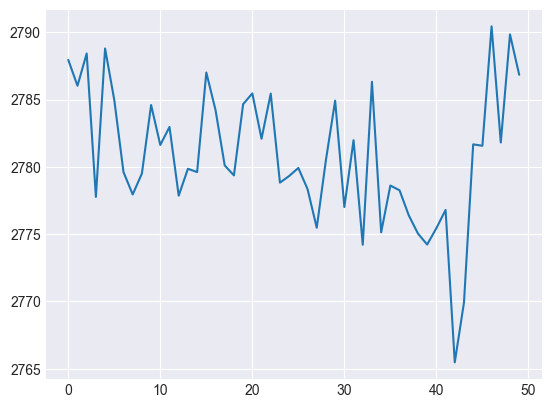

In [21]:
a = df.to_numpy()[:,1:]
plt.plot(a[:].mean(1))
plt.show()

### Load measured phantom data

target = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


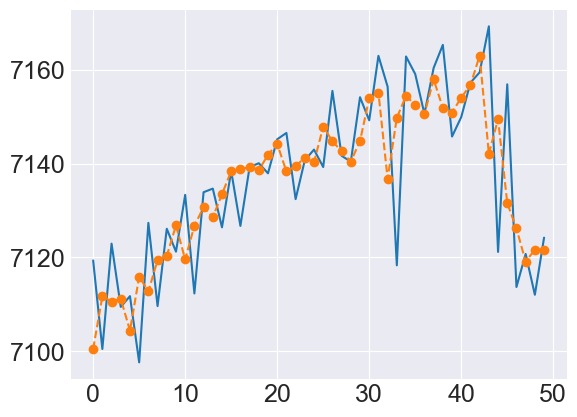

target = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 44, 45, 46, 47, 48, 49]


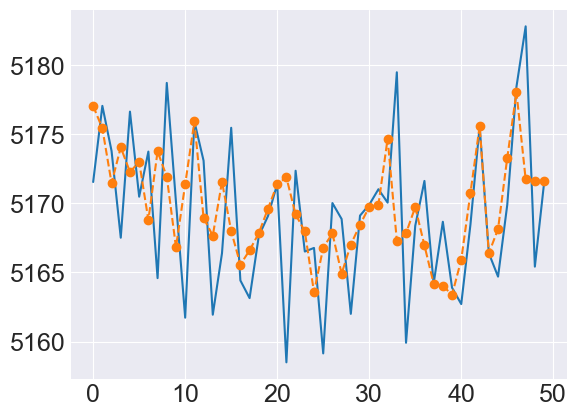

target = [0, 1, 2, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 22, 23, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44, 45, 46, 47, 48, 49]


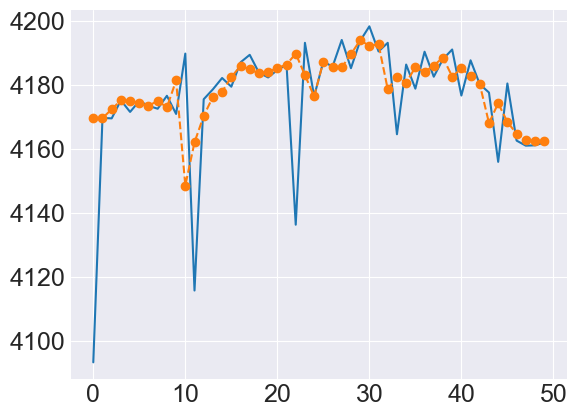

target = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


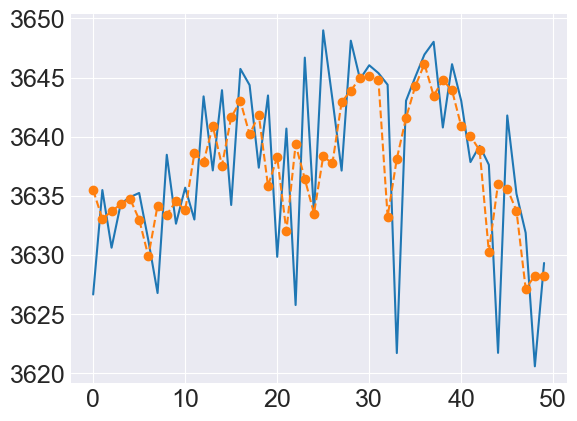

In [6]:
# get measured phantom data
phantom_data = {} # CHIK3456
for ID in phantom_measured_ID:
    # define plot savepath
    os.makedirs(os.path.join("pic", mother_folder_name, 'phantom', ID), exist_ok=True)
    
    # import measured data
    data, total_wl = process_raw_data.read_file(os.path.join(ofolder, f'{ID}_SDS1_sync.csv'))
    
    # remove spike
    remove_spike_data = process_phantom.remove_spike(total_wl, data, 
                                                     normalStdTimes=2, 
                                                     savepath=os.path.join("pic", mother_folder_name,'phantom', ID)) # remove spike
    time_mean_data = remove_spike_data.mean(0) # mean of measured signal
    
    plt.plot(data.mean(1))
    plt.plot(remove_spike_data.mean(1), 'o--')
    plt.show()
    phantom_data[ID] = time_mean_data

### Load previous measured phantom data

target = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]


KeyboardInterrupt: 

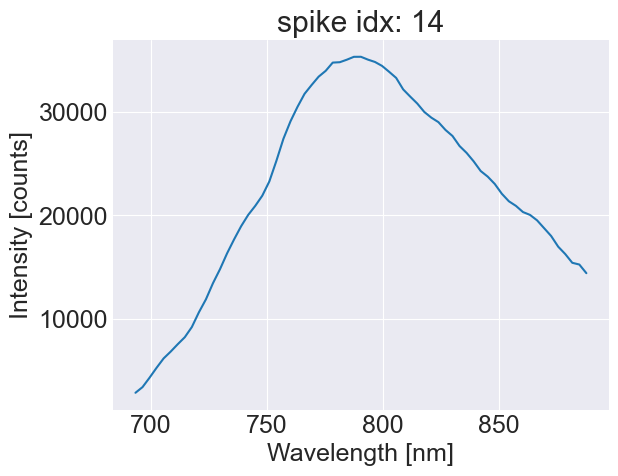

In [7]:
if previous_date != date:
    # get measured phantom data
    previous_phantom_data = {} # CHIK3456
    for ID in previous_phantom_measured_ID:
        # define plot savepath
        os.makedirs(os.path.join("pic", previous_mother_folder_name, 'phantom', ID), exist_ok=True)
        
        # import measured data
        data, total_wl = process_raw_data.read_file(os.path.join(previous_ofolder, f'{ID}_SDS1_sync.csv'))
        
        # remove spike
        remove_spike_data = process_phantom.remove_spike(total_wl, data, 
                                                        normalStdTimes=2, 
                                                        savepath=os.path.join("pic", previous_mother_folder_name,'phantom', ID)) # remove spike
        time_mean_data = remove_spike_data.mean(0) # mean of measured signal
        
        plt.plot(data.mean(1))
        plt.plot(remove_spike_data.mean(1), 'o--')
        plt.show()
        previous_phantom_data[ID] = time_mean_data
        
    for ID in phantom_measured_ID:    
        corr_raito = phantom_data[ID]/previous_phantom_data[ID]
        print(f'corr_ratio = {corr_raito}')
    corr_previous_phantom_data = previous_phantom_data.copy()
    for ID in previous_phantom_measured_ID:
        corr_previous_phantom_data[ID] = corr_raito*corr_previous_phantom_data[ID]
        
    phantom_data = corr_previous_phantom_data

### Load simulated phantom data

In [8]:
# load used wavelength
with open(os.path.join("OPs_used", "wavelength.json"), "r") as f:
    wavelength = json.load(f)
    wavelength = wavelength['wavelength']


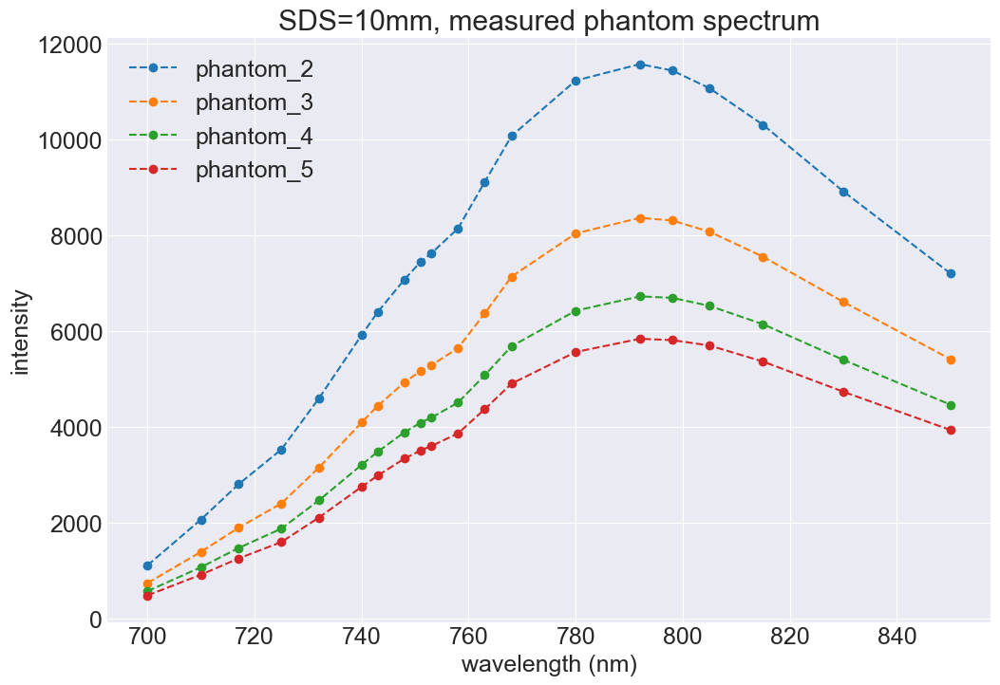

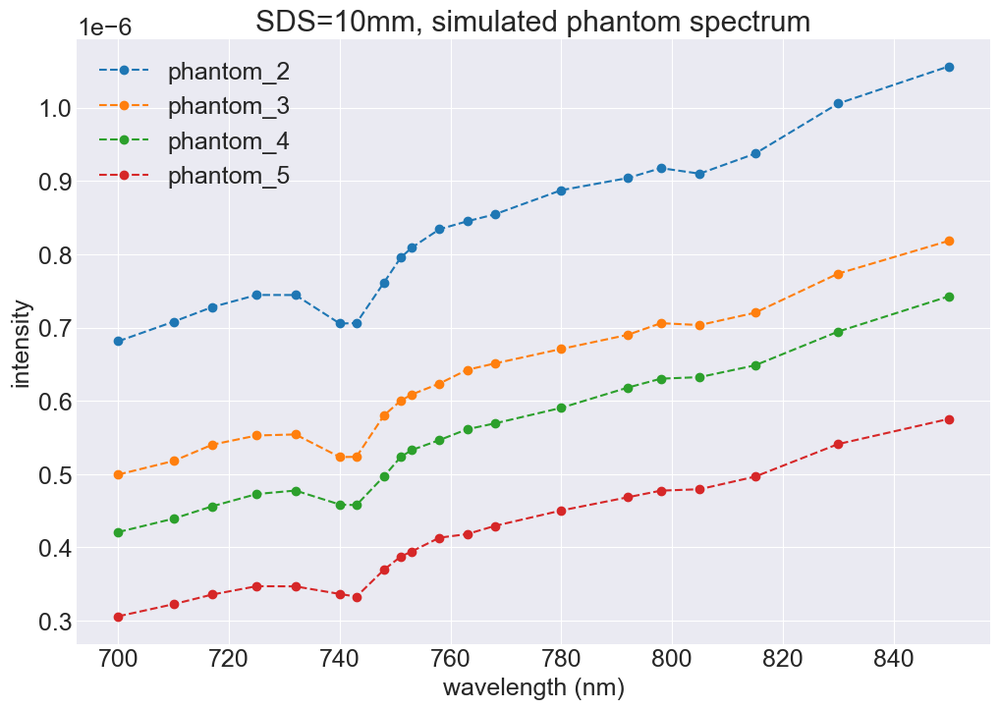

In [11]:
matplotlib.rcParams.update({'font.size': 18})
## Get the same simulated wavelength point from measured phantom
measured_phantom_data = []
plt.figure(figsize=(12,8))
# Cubic spline interpolation"
for idx, out_k in enumerate(phantom_data.keys()):
    data = phantom_data[out_k]
    f_interpolate = interp1d(total_wl, data, kind='linear', bounds_error=False, fill_value='extrapolate')
    used_wl_data = f_interpolate(wavelength)
    measured_phantom_data.append(used_wl_data)
    plt.plot(wavelength, used_wl_data, 'o--', label=f'phantom_{previous_phantom_measured_ID[idx]}')
plt.title("SDS=10mm, measured phantom spectrum")
plt.xlabel('wavelength (nm)')
plt.ylabel('intensity')
plt.legend()
plt.savefig(os.path.join("pic", mother_folder_name, 'phantom', "measured_phantom_adjust_wl.png"), dpi=300, format='png', bbox_inches='tight')
plt.show()
measured_phantom_data = np.array(measured_phantom_data)

## Get simulated phantom data
sim_phantom_data = []
plt.figure(figsize=(12,8))
for c in phantom_simulated_ID:
    data = np.load(os.path.join("dataset", "phantom_simulated", f'{c}.npy'))
    sim_phantom_data.append(data[:,SDS_idx].tolist())
    plt.plot(wavelength, data[:,SDS_idx], 'o--',label=f'phantom_{c}')
plt.title("SDS=10mm, simulated phantom spectrum")
plt.xlabel('wavelength (nm)')
plt.ylabel('intensity')
plt.legend()
plt.savefig(os.path.join("pic", mother_folder_name, 'phantom', "simulated_phantom_adjust_wl.png"), dpi=300, format='png', bbox_inches='tight')
plt.show()
sim_phantom_data = np.array(sim_phantom_data)

### Fit measured phantom and simulated phantom

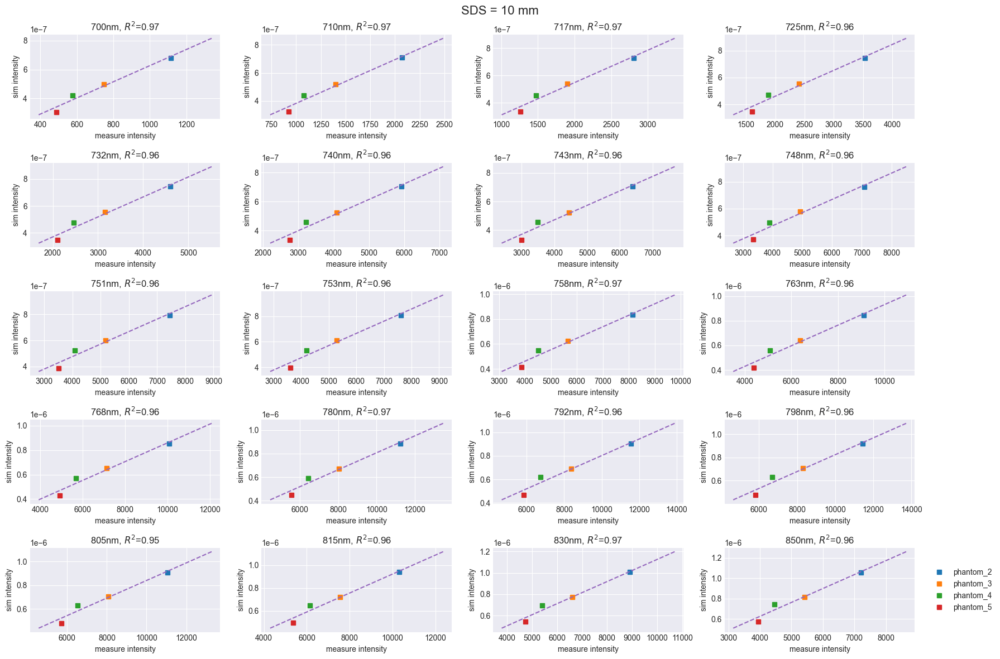

In [ ]:
fig = plt.figure(figsize=(18,12))
fig.suptitle(f"SDS = {using_SDS} mm", fontsize=16)
count = 1
for idx, used_wl in enumerate(wavelength):
    ## fit measured phantom and simulated phantom
    z = np.polyfit(measured_phantom_data[:, idx], sim_phantom_data[:,idx], 1)
    plotx = np.linspace(measured_phantom_data[-1, idx]*0.8,  measured_phantom_data[0, idx]*1.2,100)
    ploty = plotx*z[0] + z[1]
    calibrate_data = measured_phantom_data[:, idx]*z[0] + z[1]
    R_square = process_phantom.cal_R_square(calibrate_data, sim_phantom_data[:,idx]) # cal R square
    
    ## plot result
    ax = plt.subplot(5,4, count)
    ax.set_title(f"@wavelength={used_wl} nm")
    ax.set_title(f'{used_wl}nm, $R^{2}$={R_square:.2f}')
    for ID_idx, ID in enumerate(previous_phantom_measured_ID):
        ax.plot(measured_phantom_data[ID_idx, idx], sim_phantom_data[ID_idx,idx], 's', label=f'phantom_{ID}')
    ax.plot(plotx, ploty, '--')
    ax.set_xlabel("measure intensity")
    ax.set_ylabel("sim intensity")
    count += 1
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
                    fancybox=True, shadow=True)
plt.tight_layout()
plt.savefig(os.path.join('pic', mother_folder_name, 'phantom', "all.png"), dpi=300, format='png', bbox_inches='tight')
plt.show()

### Save fitting result as csv

In [ ]:
result = {}
for idx, used_wl in enumerate(wavelength):
    z = np.polyfit(measured_phantom_data[:, idx], sim_phantom_data[:,idx], 1)
    result[used_wl] = z
result = pd.DataFrame(result)
os.makedirs(os.path.join("dataset",  subject_name, 'calibration_result', date) , exist_ok=True)
result.to_csv(os.path.join("dataset",  subject_name, 'calibration_result', date, "calibrate_SDS_1.csv"), index=False)

### Plot all measured phantom together

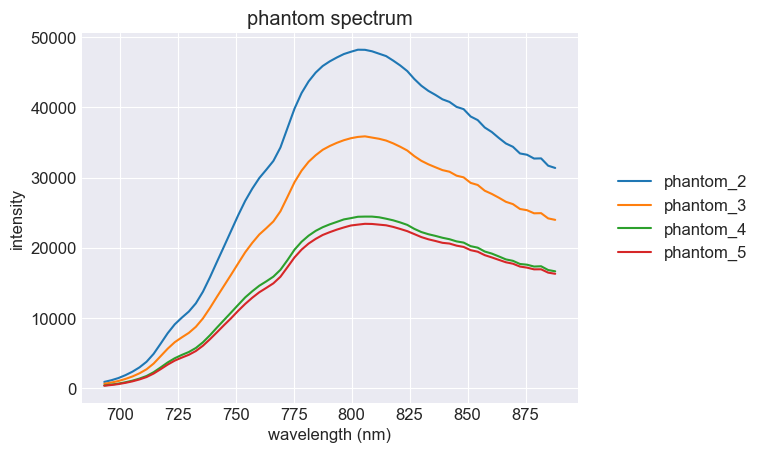

In [ ]:
for idx, k in enumerate(phantom_data.keys()):
    data = phantom_data[k]
    plt.plot(total_wl, data, label=f'phantom_{previous_phantom_measured_ID[idx]}')
plt.title('phantom spectrum')
plt.xlabel('wavelength (nm)')
plt.ylabel('intensity')
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
                fancybox=True, shadow=True)
plt.savefig(os.path.join("pic", mother_folder_name, 'phantom', "measured_2345_phantom_result.png"), dpi=300, format='png', bbox_inches='tight')
plt.show()